# `EEG analysis`

---

### `Import libraries and dataset`


In [3]:
import pandas as pd
import pywt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv('/content/emotions.csv')

### `Dataset metadata`

In [5]:
data.shape

(2132, 2549)

In [ ]:
data.head()

In [6]:
data.columns

Index(['# mean_0_a', 'mean_1_a', 'mean_2_a', 'mean_3_a', 'mean_4_a',
       'mean_d_0_a', 'mean_d_1_a', 'mean_d_2_a', 'mean_d_3_a', 'mean_d_4_a',
       ...
       'fft_741_b', 'fft_742_b', 'fft_743_b', 'fft_744_b', 'fft_745_b',
       'fft_746_b', 'fft_747_b', 'fft_748_b', 'fft_749_b', 'label'],
      dtype='object', length=2549)

In [10]:
data['label'].value_counts()

NEUTRAL     716
NEGATIVE    708
POSITIVE    708
Name: label, dtype: int64

### `Visualising the data`

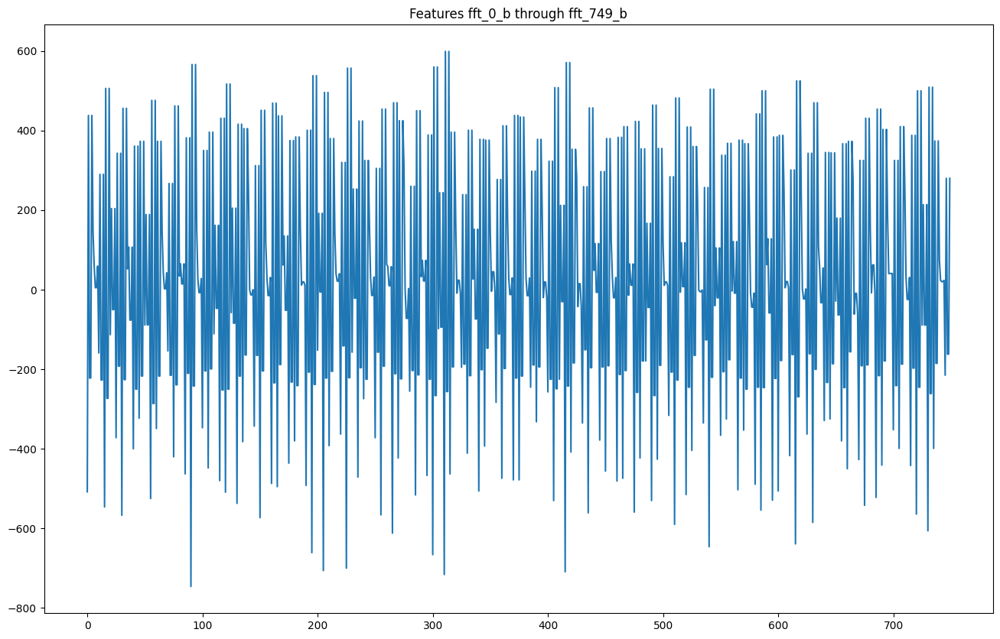

In [3]:
sample = data.loc[0, 'fft_0_b':'fft_749_b']

plt.figure(figsize=(16, 10))
plt.plot(range(len(sample)), sample)
plt.title("Features fft_0_b through fft_749_b")
plt.show()



---



### `Wavelet Transformation`

In [7]:
# Exclude the "labels" column from the data
fft_columns = [col for col in data.columns if col.startswith('fft_')]
eeg_data = data[fft_columns]
scales = range(1, 129)

In [8]:
# Compute the continuous wavelet transform for each channel
wavelets = []
for channel in range(eeg_data.shape[1]):
    data = eeg_data.iloc[:,channel]
    coefficients, freqs = pywt.cwt(data, scales, 'morl', sampling_period=1/256)
    wavelets.append(coefficients)

### `Visualising wavelets`

#### first

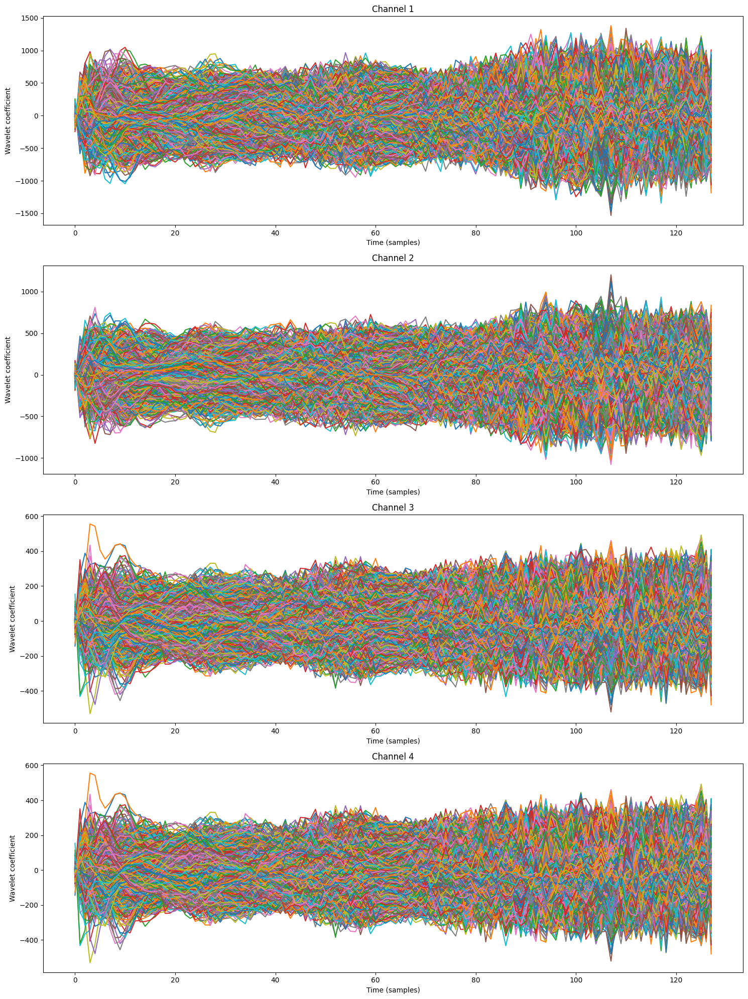

In [13]:
# Select a small group of channels to visualize
channels_to_visualize = [0, 1, 2, 3]

# Visualize the wavelet coefficients for each channel using Matplotlib
fig, axes = plt.subplots(nrows=len(channels_to_visualize), ncols=1, figsize=(15, 5*len(channels_to_visualize)))
for i, channel in enumerate(channels_to_visualize):
    ax = axes[i]
    ax.plot(wavelets[channel])
    ax.set_title('Channel {}'.format(channel+1))
    ax.set_ylabel('Wavelet coefficient')
    ax.set_xlabel('Time (samples)')
plt.tight_layout()
plt.show()


#### Second

In [ ]:
# Define the number of channels to plot
num_channels = 3

# Define the scales for the wavelet transform
scales = range(1, 129)

# Exclude the "labels" column from the data
eeg_data = data.drop('label', axis=1)

# Define the labels for each row
labels = data['label']

# Group the data by label
grouped_data = eeg_data.groupby(labels)

# Loop over each label group
for label, group in grouped_data:
    # Select a random subset of channels to plot
    channels = np.random.choice(group.shape[1], size=num_channels, replace=False)
    # Loop over the selected channels
    for channel in channels:
        # Apply the wavelet transform to the channel data
        wavelets, _ = pywt.cwt(group.iloc[:, channel], scales, 'morl')
        # Plot the wavelet coefficients for the channel
        plt.figure()
        plt.title(f'Label: {label}, Channel: {channel+1}')
        plt.imshow(wavelets, aspect='auto', cmap='coolwarm')
        plt.xlabel('Time (samples)')
        plt.ylabel('Scale')
        plt.colorbar()
        plt.show()


#### Third

In [ ]:
# Loop over each label group
for label, group in grouped_data:
    # Select a random subset of channels to plot
    channels = np.random.choice(group.shape[1], size=num_channels, replace=False)
    # Loop over the selected channels
    for channel in channels:
        # Apply the wavelet transform to the channel data
        wavelets, _ = pywt.cwt(group.iloc[:, channel], scales, 'morl')
        # Plot the wavelet coefficients for the channel
        plt.figure()
        plt.title(f'Label: {label}, Channel: {channel+1}')
        plt.plot(wavelets.T)
        plt.xlabel('Time (samples)')
        plt.ylabel('Wavelet coefficient')
        plt.show()

#### Seaborn | Wavelets

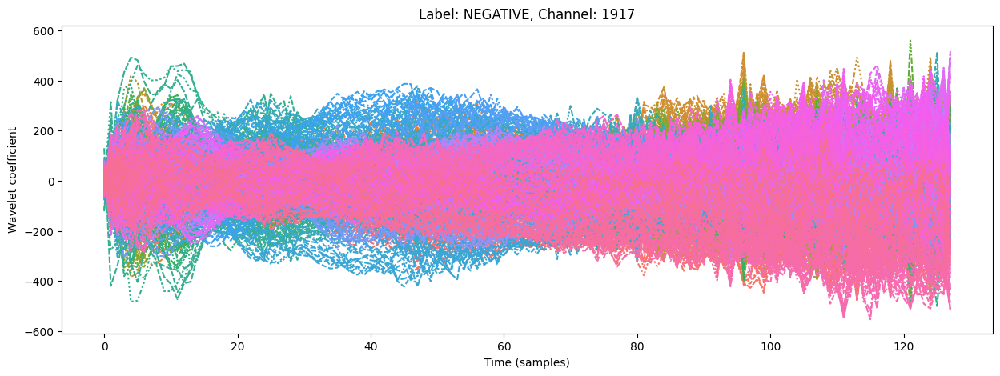

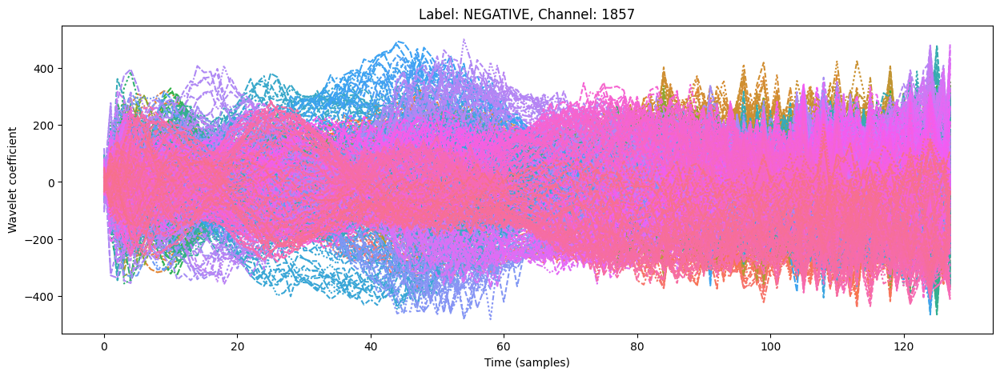

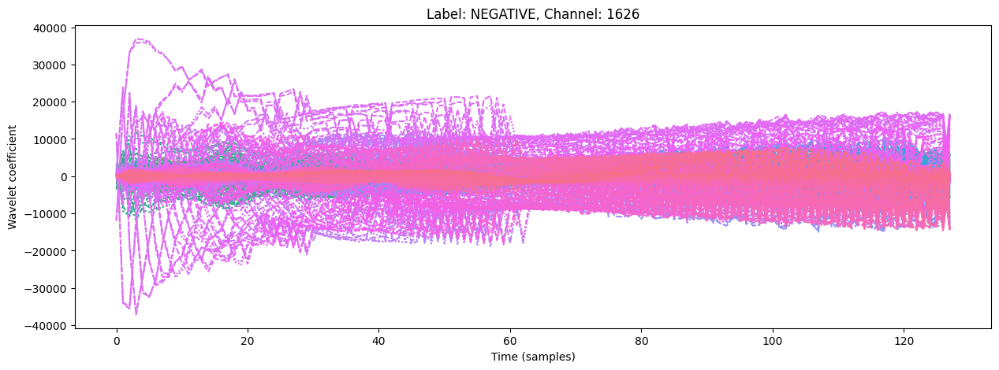

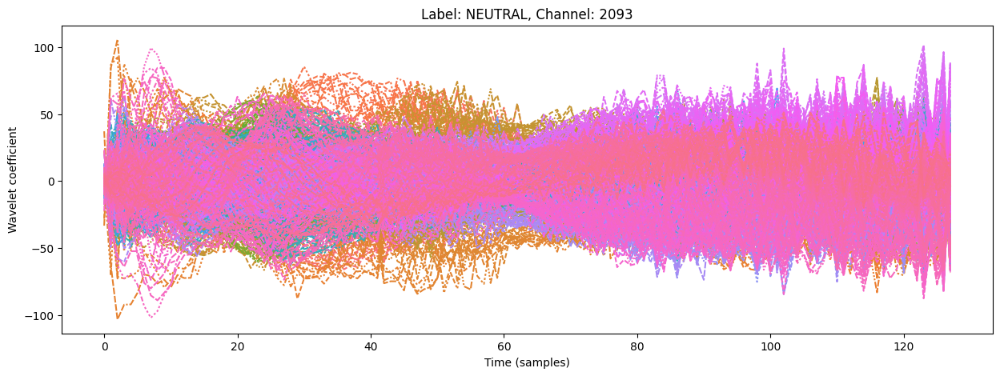

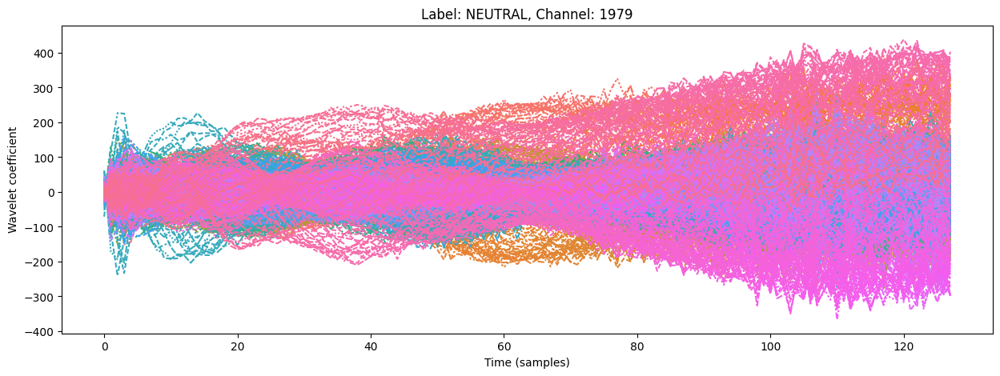

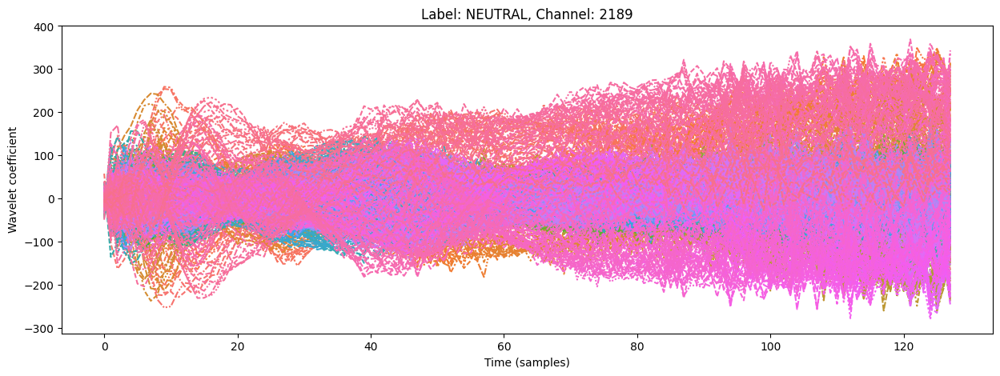

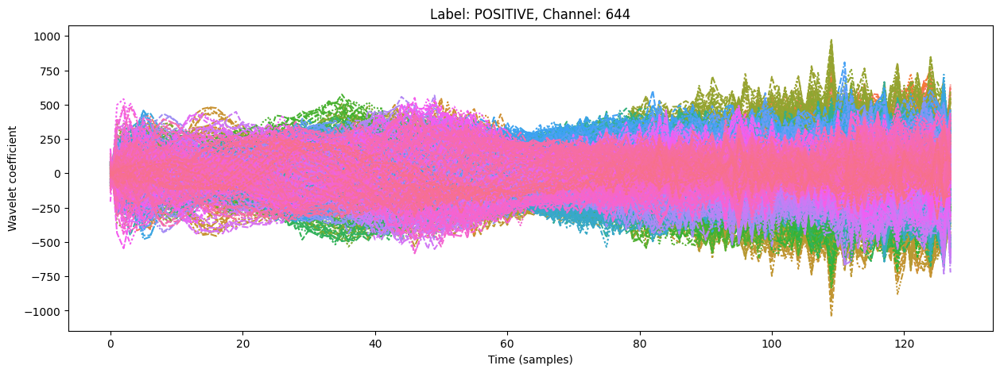

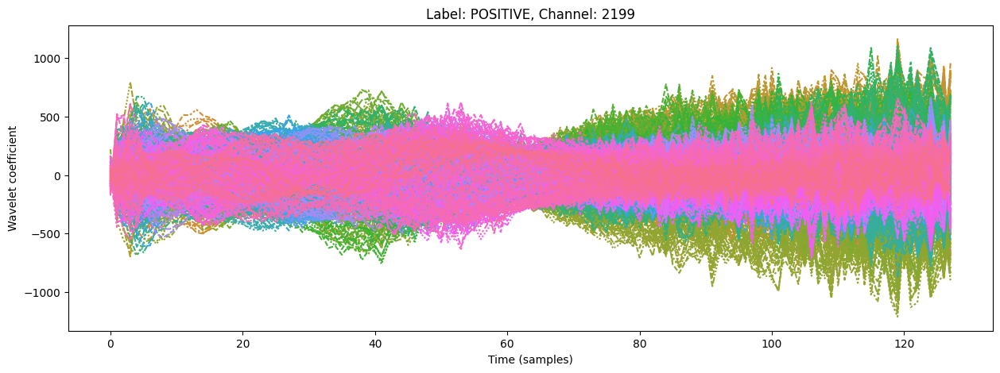

In [ ]:
for label, group in grouped_data:
    # Select a random subset of channels to plot
    channels = np.random.choice(group.shape[1], size=num_channels, replace=False)
    # Loop over the selected channels
    for channel in channels:
        # Apply the wavelet transform to the channel data
        wavelets, _ = pywt.cwt(group.iloc[:, channel], scales, 'morl')
        # Plot the wavelet coefficients for the channel
        fig, ax = plt.subplots(figsize=(15, 5))
        ax.set_title(f'Label: {label}, Channel: {channel+1}')
        ax.set_xlabel('Time (samples)')
        ax.set_ylabel('Wavelet coefficient')
        sns.lineplot(data=wavelets, ax=ax, legend=False)
        plt.show()